In [2]:
!pip install ultralytics


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 898.7/898.7 kB 1.9 MB/s eta 0:00:00


In [3]:
from ultralytics import YOLO
import cv2
import torch
import os
from IPython.display import display , Image
from IPython import display
display.clear_output()
!yolo mode=checks


Traceback (most recent call last):
  File "/usr/local/bin/yolo", line 8, in <module>
    sys.exit(entrypoint())
  File "/usr/local/lib/python3.10/dist-packages/ultralytics/cfg/__init__.py", line 911, in entrypoint
    raise ValueError(f"Invalid 'mode={mode}'. Valid modes are {MODES}.\n{CLI_HELP_MSG}")
ValueError: Invalid 'mode=<module 'ultralytics.utils.checks' from '/usr/local/lib/python3.10/dist-packages/ultralytics/utils/checks.py'>'. Valid modes are {'benchmark', 'export', 'train', 'predict', 'track', 'val'}.

    Arguments received: ['yolo', 'mode=checks']. Ultralytics 'yolo' commands use the following syntax:

        yolo TASK MODE ARGS

        Where   TASK (optional) is one of {'detect', 'obb', 'classify', 'pose', 'segment'}
                MODE (required) is one of {'benchmark', 'export', 'train', 'predict', 'track', 'val'}
                ARGS (optional) are any number of custom 'arg=value' pairs like 'imgsz=320' that override defaults.
                    See all ARGS at ht

In [ ]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="")
project = rf.workspace("heithemxnoor").project("plate-detection-mmkbw")
version = project.version(9)
dataset = version.download("yolov8")


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 81.5/81.5 kB 5.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 6.4 MB/s eta 0:00:00
  Attempting uninstall: idna
    Found existing installation: idna 3.10
    Uninstalling idna-3.10:
      Successfully uninstalled idna-3.10
loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to plate-detection-9 in yolov8:: 100%|██████████| 1085/1085 [00:00<00:00, 7223.89it/s]


In [5]:
!yolo task=detect mode=train model=yolov8m.pt data={dataset.location}/data.yaml epochs=35 imgsz=640

100% 49.7M/49.7M [00:00<00:00, 333MB/s]
Ultralytics 8.3.49 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8m.pt, data=/content/plate-detection-9/data.yaml, epochs=35, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=F

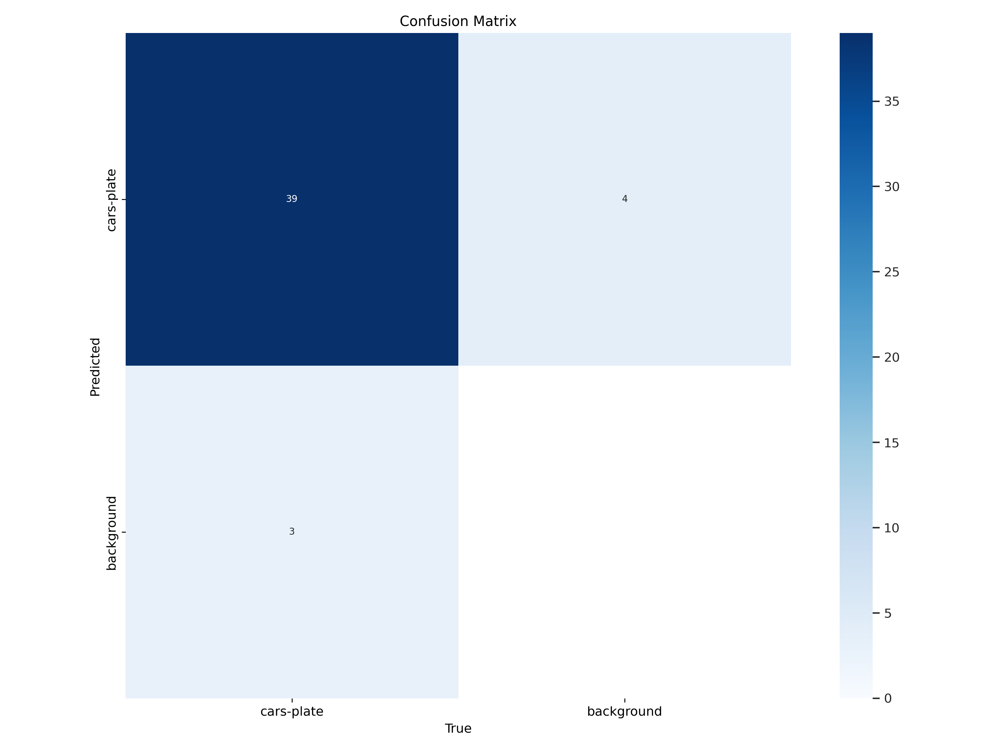

In [6]:
Image(filename=f'/content/runs/detect/train/confusion_matrix.png', width=600)

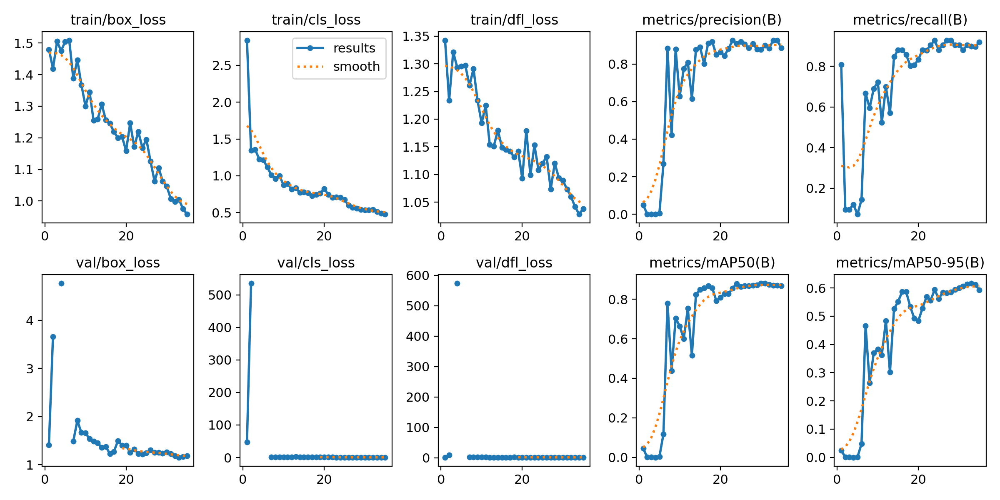

In [7]:
Image(filename=f'/content/runs/detect/train/results.png', width=600)

In [8]:
!yolo task=detect mode=val model=/content/runs/detect/train/weights/best.pt data={dataset.location}/data.yaml

Ultralytics 8.3.49 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 218 layers, 25,840,339 parameters, 0 gradients, 78.7 GFLOPs
val: Scanning /content/plate-detection-9/valid/labels.cache... 42 images, 0 backgrounds, 0 corrupt: 100% 42/42 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 3/3 [00:02<00:00,  1.28it/s]
                   all         42         42      0.926      0.898       0.87       0.62
Speed: 3.9ms preprocess, 24.1ms inference, 0.0ms loss, 15.7ms postprocess per image
Results saved to runs/detect/val
💡 Learn more at https://docs.ultralytics.com/modes/val


In [9]:
!yolo task=detect mode=predict model=/content/runs/detect/train/weights/best.pt source={dataset.location}/test/images save=True

Ultralytics 8.3.49 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 218 layers, 25,840,339 parameters, 0 gradients, 78.7 GFLOPs

image 1/109 /content/plate-detection-9/test/images/-271x315_png.rf.8bbfab715f4bc05781215c3e1c2d2743.jpg: 640x640 1 cars-plate, 36.9ms
image 2/109 /content/plate-detection-9/test/images/055ea5e8c91650b415c6b61ef76b7451_jpg.rf.66a2ef0b8eaf40893156ea54ffb7a920.jpg: 640x640 2 cars-plates, 37.0ms
image 3/109 /content/plate-detection-9/test/images/125-200840_png.rf.31a10f33331e48da34c655a04c04b5ad.jpg: 640x640 1 cars-plate, 37.6ms
image 4/109 /content/plate-detection-9/test/images/201006_png.rf.61c8f08ca92a8138b071ae483f4a30a9.jpg: 640x640 1 cars-plate, 37.0ms
image 5/109 /content/plate-detection-9/test/images/201034_png.rf.105824d04fc63fdd36feb460ef714086.jpg: 640x640 1 cars-plate, 37.1ms
image 6/109 /content/plate-detection-9/test/images/201040_png.rf.157f6c6a7d7424193b9da6a91bf3f825.jpg: 640x640 1 cars-plate, 30.3ms
image 7/1

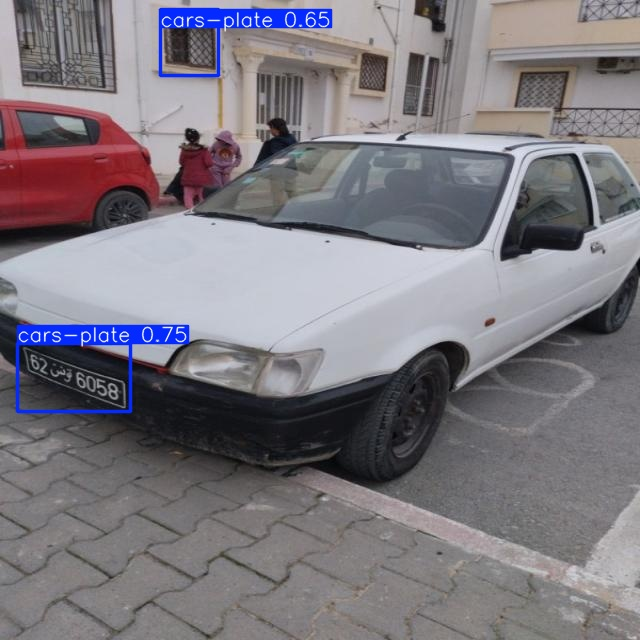

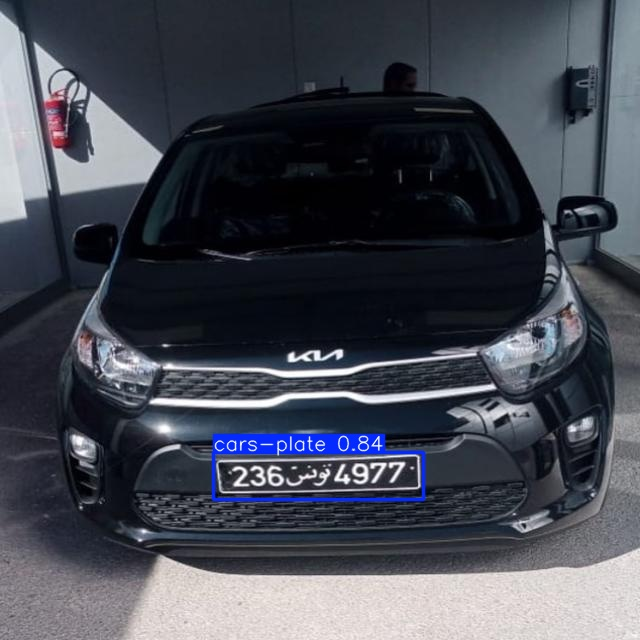

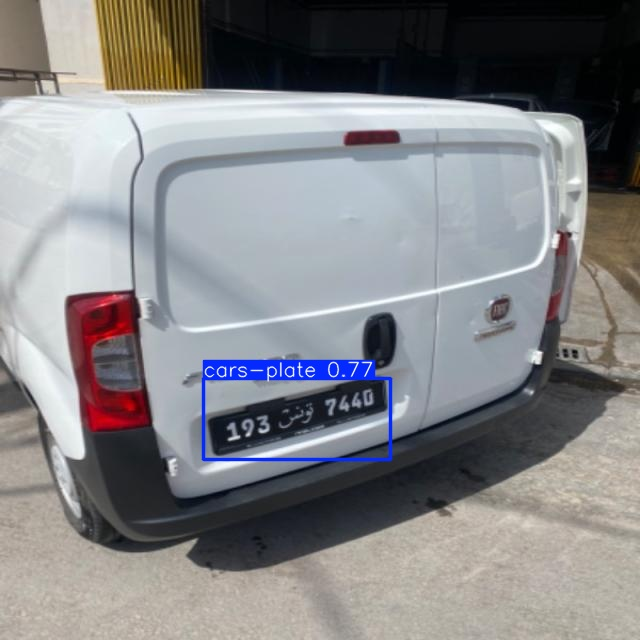

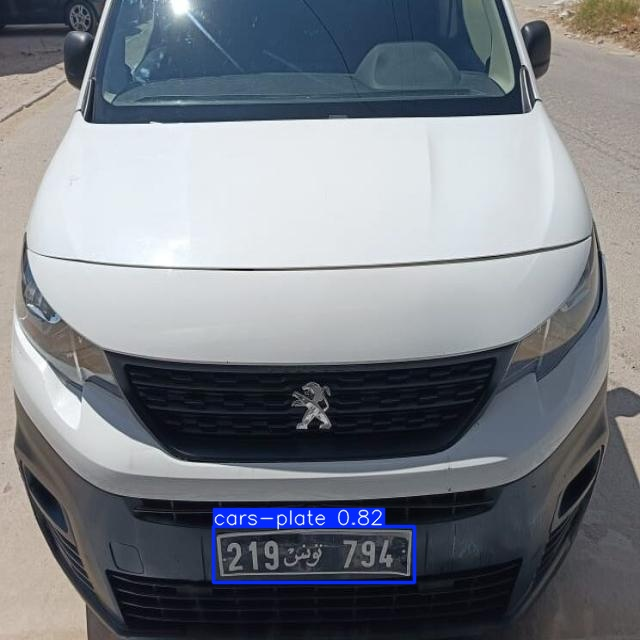

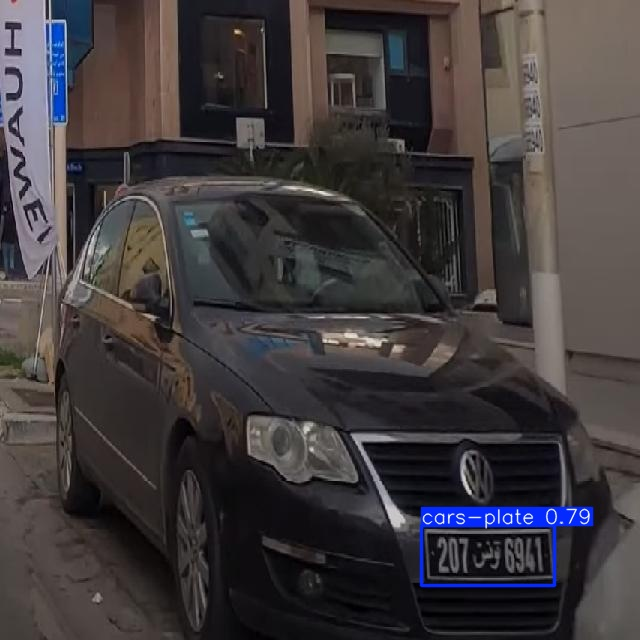

...

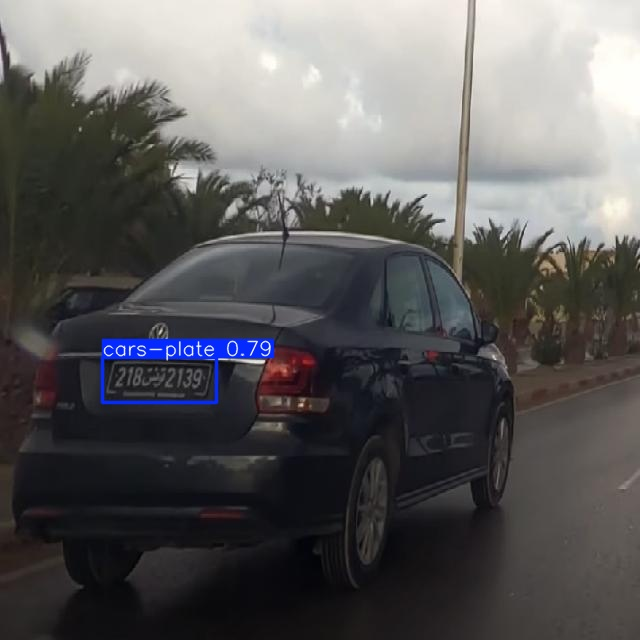

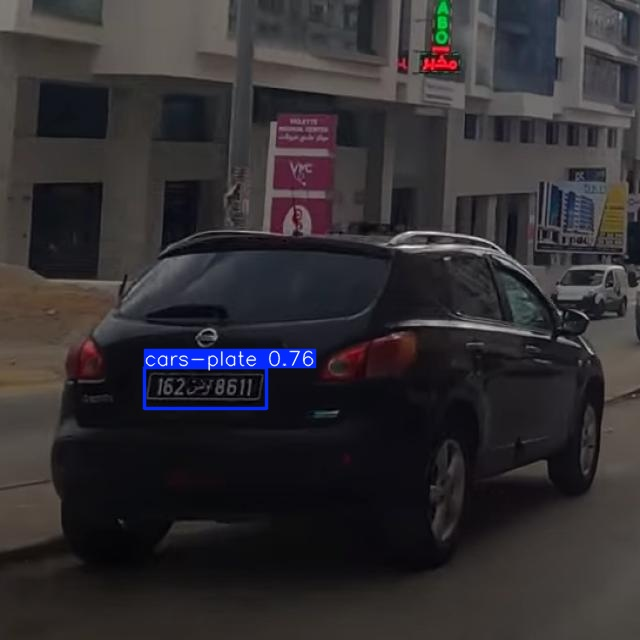

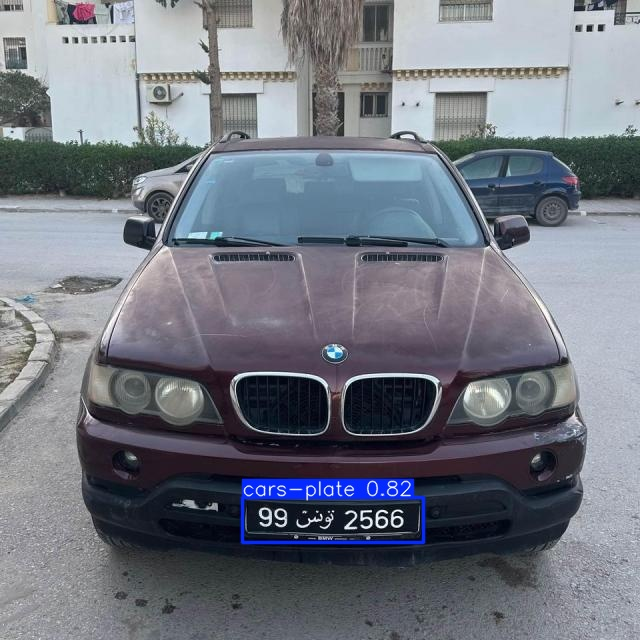

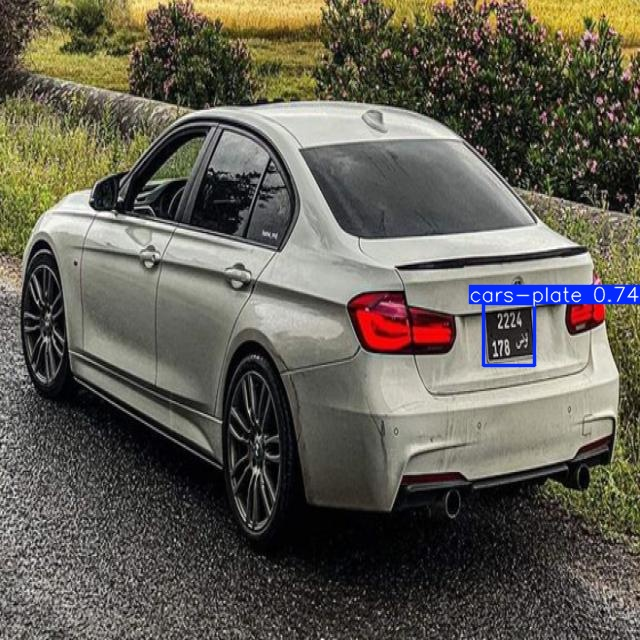

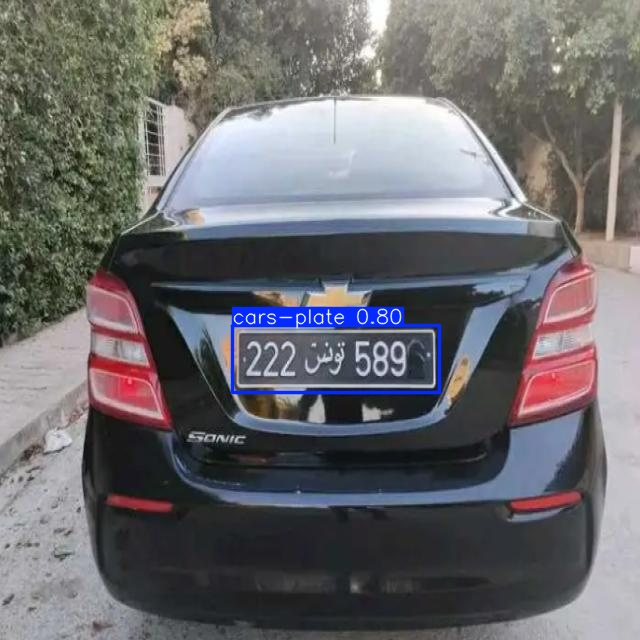

In [10]:
import glob
from IPython.display import Image , display
for imageName in glob.glob(f'/content/runs/detect/predict/*.jpg'):
  display(Image(filename=imageName , height=600))
  print("\n")

In [11]:
!yolo task=detect mode=predict model=/content/runs/detect/train/weights/best.pt source=/content/car.jpg save=True


Ultralytics 8.3.49 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 218 layers, 25,840,339 parameters, 0 gradients, 78.7 GFLOPs

image 1/1 /content/car.jpg: 384x640 1 cars-plate, 61.8ms
Speed: 2.4ms preprocess, 61.8ms inference, 732.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs/detect/predict2
💡 Learn more at https://docs.ultralytics.com/modes/predict


In [12]:
!zip -r model.zip /content/runs/detect/train/


  adding: content/runs/detect/train/ (stored 0%)
  adding: content/runs/detect/train/PR_curve.png (deflated 26%)
  adding: content/runs/detect/train/F1_curve.png (deflated 17%)
  adding: content/runs/detect/train/weights/ (stored 0%)
  adding: content/runs/detect/train/weights/best.pt (deflated 8%)
  adding: content/runs/detect/train/weights/last.pt (deflated 8%)
  adding: content/runs/detect/train/P_curve.png (deflated 18%)
  adding: content/runs/detect/train/labels.jpg (deflated 33%)
  adding: content/runs/detect/train/train_batch1.jpg (deflated 2%)
  adding: content/runs/detect/train/results.csv (deflated 61%)
  adding: content/runs/detect/train/train_batch627.jpg (deflated 7%)
  adding: content/runs/detect/train/confusion_matrix_normalized.png (deflated 36%)
  adding: content/runs/detect/train/confusion_matrix.png (deflated 38%)
  adding: content/runs/detect/train/R_curve.png (deflated 18%)
  adding: content/runs/detect/train/train_batch0.jpg (deflated 2%)
  adding: content/runs/de

In [14]:
from google.colab import files  

files.download('model.zip')


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [17]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [18]:

model_path = '/content/runs/detect/train/weights/best.pt'

destination_path = '/content/drive/My Drive/best.pt'

!cp {model_path} {destination_path}

print(f"Modèle sauvegardé dans Google Drive : {destination_path}")



cp: target 'Drive/best.pt' is not a directory
Modèle sauvegardé dans Google Drive : /content/drive/My Drive/best.pt


In [23]:
from PIL import Image

model = YOLO('/content/runs/detect/train/weights/best.pt')
output_dir = '/content/matricules'
os.makedirs(output_dir, exist_ok=True)
results = model.predict(source="/content/car.jpg", save=False, conf=0.5)

for result in results:
    image = Image.open(result.path)
    boxes = result.boxes 
    for box in boxes:
        cls = int(box.cls) 
        if cls == 0:  
            x1, y1, x2, y2 = map(int, box.xyxy[0]) 
            cropped = image.crop((x1, y1, x2, y2))
            output_path = os.path.join(output_dir, f"plate_{x1}_{y1}.jpg")
            cropped.save(output_path)
            cropped.show()  


image 1/1 /content/car.jpg: 384x640 1 cars-plate, 25.7ms
Speed: 1.9ms preprocess, 25.7ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)
